<div style="width: 100%; overflow: hidden;">
    <div style="width: 150px; float: left;"> <img src="https://raw.githubusercontent.com/DataForScience/Networks/master/data/D4Sci_logo_ball.png" alt="Data For Science, Inc" align="left" border="0" width=150px> </div>
    <div style="float: left; margin-left: 10px;"> <h1>Community Detection</h1>
<h1>Girvan-Newman Algorithm</h1>
        <p>Bruno Gonçalves<br/>
        <a href="http://www.data4sci.com/">www.data4sci.com</a><br/>
            @bgoncalves, @data4sci</p></div>
</div>

In [1]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches

import sqlite3
import itertools
import networkx as nx

import tqdm as tq
from tqdm import tqdm 

import watermark

%load_ext watermark
%matplotlib inline

We start by print out the versions of the libraries we're using for future reference

In [2]:
%watermark -n -v -m -g -iv

Python implementation: CPython
Python version       : 3.8.5
IPython version      : 7.19.0

Compiler    : Clang 10.0.0 
OS          : Darwin
Release     : 21.2.0
Machine     : x86_64
Processor   : i386
CPU cores   : 16
Architecture: 64bit

Git hash: 61e53d393092293a1f7ef37b0edf06fbb69a1a05

watermark : 2.1.0
numpy     : 1.19.2
pandas    : 1.1.3
json      : 2.0.9
matplotlib: 3.3.2
networkx  : 2.5
tqdm      : 4.62.0
sqlite3   : 2.6.0



Load default figure style

In [3]:
plt.style.use('./d4sci.mplstyle')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Code

/Users/bgoncalves/opt/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


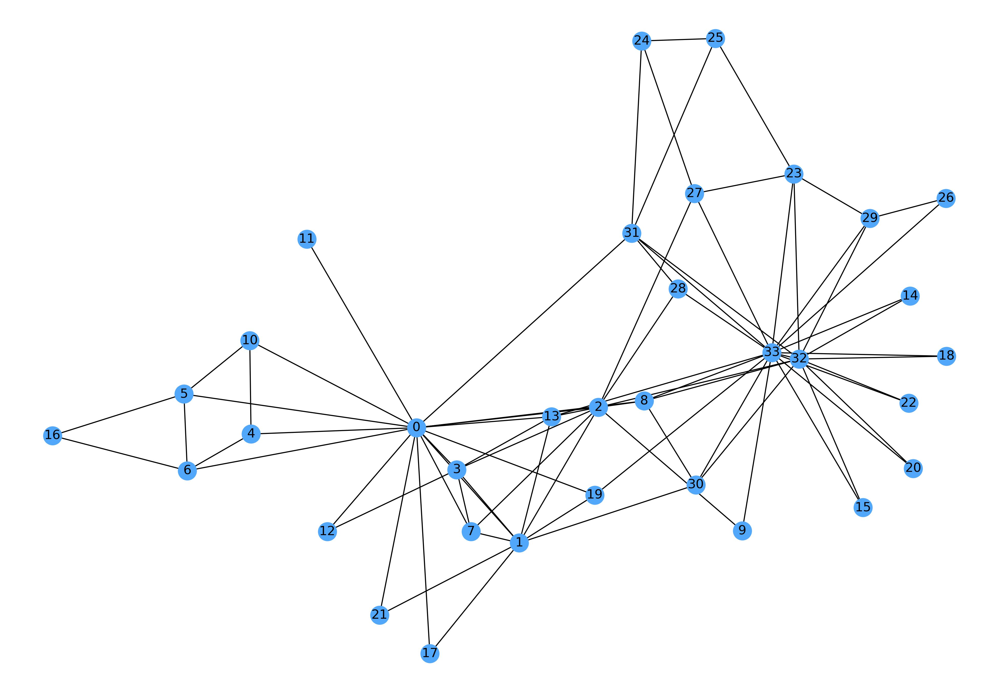

In [4]:
# load the graph
G = nx.karate_club_graph()
np.random.seed(123)
layout = nx.layout.spring_layout(G)
nx.draw(G, pos=layout, with_labels = True, node_color=colors[0])

In [5]:
def girvan_newman(graph):
    # Number of nodes
    N = graph.number_of_nodes()

    # Number of connected components
    N_comp = nx.number_connected_components(graph)
    
    comps = {}
    
    # Don't stop until we're down to just individual nodes
    while(N_comp != N):
        # Compute the betweeness centrality of each edge
        betweeness = nx.edge_betweenness_centrality(graph)
        
        # Get the edge with the highest betweeness centrality
        max_betweeness = max(betweeness.items(), key=lambda item: item[1])[0]
        
        # Remove it from the graph
        graph.remove_edge(*max_betweeness)
        
        # Check the current number of components
        N_comp = nx.number_connected_components(graph)
        
        # Keep track of each breaking of the graph
        if N_comp > 1:
            comps[N_comp] = list(nx.connected_components(graph))
            
    return comps

In [6]:
communities = girvan_newman(G.copy())

In [7]:
communities

{2: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21},
  {2, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}],
 3: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21},
  {2, 8, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33},
  {9}],
 4: [{0, 1, 3, 7, 11, 12, 13, 17, 19, 21},
  {2, 8, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33},
  {4, 5, 6, 10, 16},
  {9}],
 5: [{0, 1, 3, 7, 11, 12, 13, 17, 19, 21},
  {2, 24, 25, 27, 28, 31},
  {4, 5, 6, 10, 16},
  {8, 14, 15, 18, 20, 22, 23, 26, 29, 30, 32, 33},
  {9}],
 6: [{0, 1, 3, 7, 12, 13, 17, 19, 21},
  {2, 24, 25, 27, 28, 31},
  {4, 5, 6, 10, 16},
  {8, 14, 15, 18, 20, 22, 23, 26, 29, 30, 32, 33},
  {9},
  {11}],
 7: [{0, 1, 3, 7, 12, 13, 17, 19, 21},
  {2, 24, 25, 27, 28, 31},
  {4, 5, 6, 10, 16},
  {8, 14, 15, 18, 20, 22, 23, 29, 30, 32, 33},
  {9},
  {11},
  {26}],
 8: [{0, 1, 3, 7, 13, 17, 19, 21},
  {2, 24, 25, 27, 28, 31},
  {4, 5, 6, 10, 16},
  {8, 14, 15, 18, 20, 22, 23,

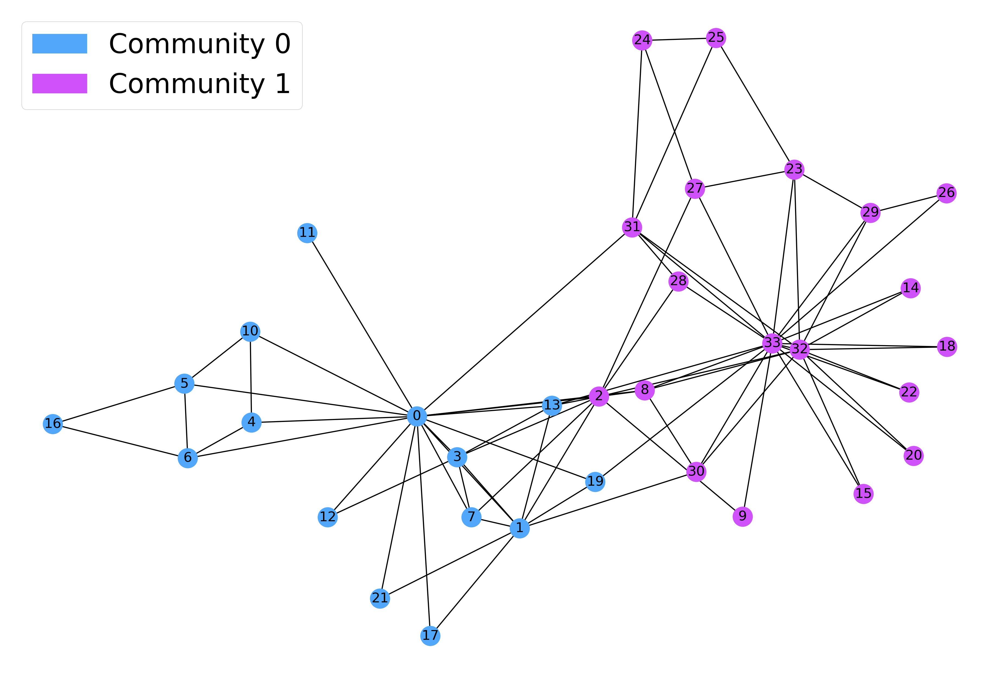

In [8]:
node_groups = communities[2]
leg_handles = []

# plot the communities
color_map = {}
for i in range(len(node_groups)):
    patch = mpatches.Patch(color=colors[i], label='Community %u' % i)
    leg_handles.append(patch)
    
    for node in node_groups[i]:
        color_map[node] = colors[i]
        
color_map = [color for node, color in sorted(color_map.items())]

fig, ax = plt.subplots(1)
nx.draw(G, pos=layout, node_color=color_map, with_labels=True, ax=ax)
ax.legend(handles=leg_handles)

## Co-Authorship Network

From [Kaggle](https://www.kaggle.com/kevinvdsk/community-detection/data)

In [9]:
connect = sqlite3.connect('data/paper_authors.sqlite')

We keep only papers from 2014 and 2015

In [10]:
query = """
SELECT pa.paper_id, pa.author_id, a.name
FROM paper_authors AS pa JOIN papers AS p ON pa.paper_id = p.id
JOIN authors as a ON pa.author_id = a.id
WHERE p.Year BETWEEN '2014' AND '2015'
"""

In [11]:
df = pd.read_sql(query, connect)

In [12]:
df.name = df.name.map(lambda x: x.title().strip())

In [13]:
# Initialize graph
G = nx.Graph()

for p, a in df.groupby('paper_id')['name']: 
    for u, v in itertools.combinations(a, 2):
        if G.has_edge(u, v):
            G[u][v]['weight'] += 1
        else:
            G.add_edge(u, v, weight=1)
            
# Print graph size
print('\nSize of graph, i.e. number of edges:', G.size())


Size of graph, i.e. number of edges: 3216


In [14]:
G.number_of_nodes()

1845

Extract the Giant Connected Component

In [15]:
GCC = sorted([(len(comp), comp) for comp in nx.connected_components(G)], reverse=True)[0][1]

In [16]:
G_gcc = nx.subgraph(G, GCC)

In [17]:
G_gcc.number_of_nodes()

521

In [18]:
G_gcc.number_of_edges()

1099

Generate a reproducible layout

In [19]:
np.random.seed(1337)
pos = nx.layout.kamada_kawai_layout(G_gcc, weight='weight')

Extract the weights of each edge

In [20]:
weights = []

for node_i, node_j, data in G_gcc.edges(data=True):
    weights.append(data['weight'])

Plot the network

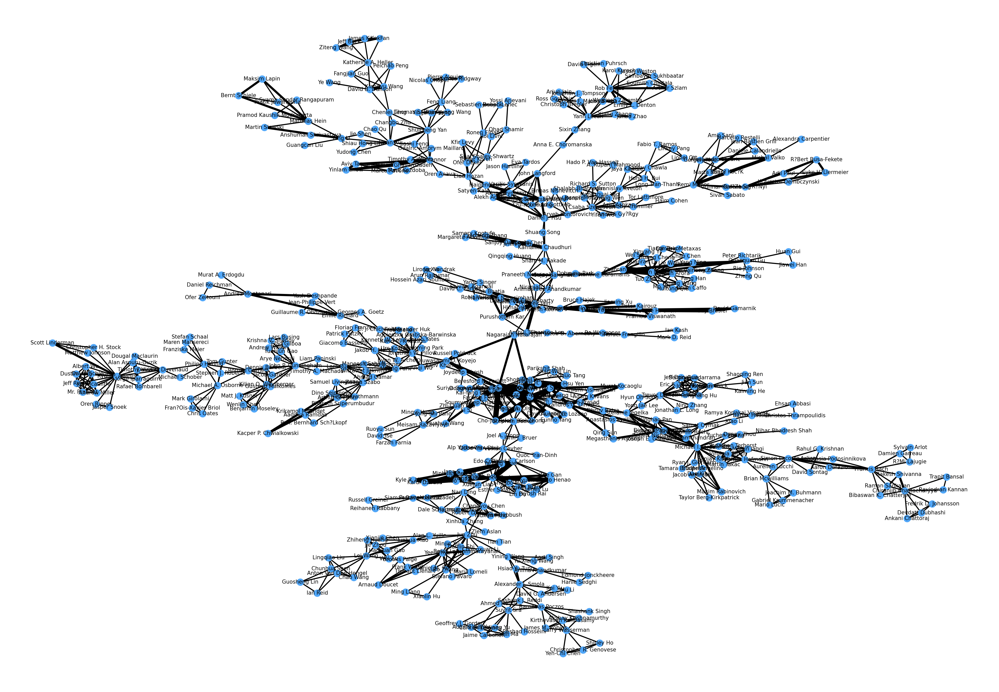

In [21]:
nx.draw(G_gcc, pos=pos, node_size=40, node_color=colors[0], width=weights, font_size=5, with_labels=True)

## Community Structure

In [22]:
communities = nx.community.girvan_newman(G_gcc, 
                                   lambda G: max(nx.edge_betweenness_centrality(G, weight='weight').items(), 
                                                 key=lambda x:x[1])[0])

In [23]:
two_comms = next(communities)

Naturally, we find two sets of nodes

In [24]:
len(two_comms)

2

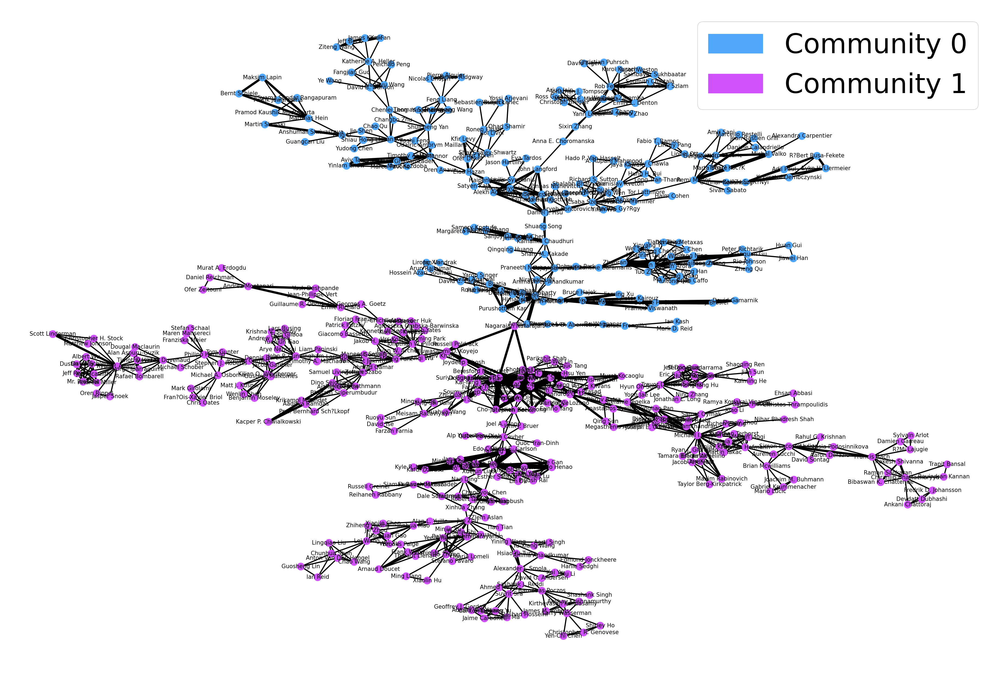

In [25]:
leg_handles = []

# plot the communities
color_map = []
for node in G_gcc.nodes():
    color = colors[0] if node in two_comms[0] else colors[1]
    color_map.append(color)

for i in range(len(two_comms)):
    patch = mpatches.Patch(color=colors[i], label='Community %u' % i)
    leg_handles.append(patch)
    
fig, ax = plt.subplots(1)
nx.draw(G_gcc, pos=pos, node_color=color_map, 
        with_labels=True, ax=ax, node_size=40, width=weights, font_size=5)
ax.legend(handles=leg_handles)

Four communities

In [26]:
three_comms = next(communities)
four_comms = next(communities)

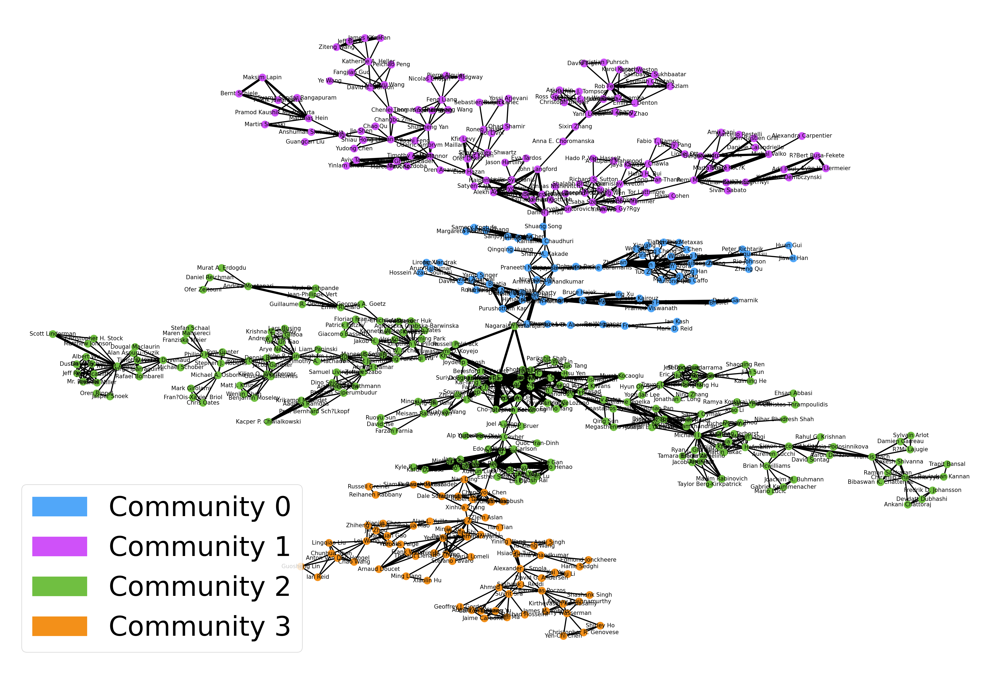

In [27]:
leg_handles = []

# plot the communities
color_map = []
for node in G_gcc.nodes():
    for i in range(len(four_comms)):
        if node in four_comms[i]:
            color = colors[i]
            break
            
    color_map.append(color)

for i in range(len(four_comms)):
    patch = mpatches.Patch(color=colors[i], label='Community %u' % i)
    leg_handles.append(patch)
    
fig, ax = plt.subplots(1)
nx.draw(G_gcc, pos=pos, node_color=color_map, 
        with_labels=True, ax=ax, node_size=40, width=weights, font_size=5)
ax.legend(handles=leg_handles)

# Modularity

In [28]:
communities = nx.community.girvan_newman(G_gcc, 
                                   lambda G: max(nx.edge_betweenness_centrality(G, weight='weight').items(), 
                                                 key=lambda x:x[1])[0])

In [29]:
N = G_gcc.number_of_nodes()

In [30]:
modularity = {}
comms = {}

for i in tqdm(range(2, N), total=N-2):
    # Extract community structure from iterator
    comms[i] = next(communities)
    
    # Compute the modularity
    modularity[i] = nx.community.modularity(G_gcc, comms[i])

100%|██████████| 519/519 [01:13<00:00,  7.08it/s]


In [31]:
modularity = pd.DataFrame(modularity.items()).set_index(0)

In [32]:
max_modularity = int(modularity.idxmax())

Text(0, 0.5, 'Modularity (Q)')

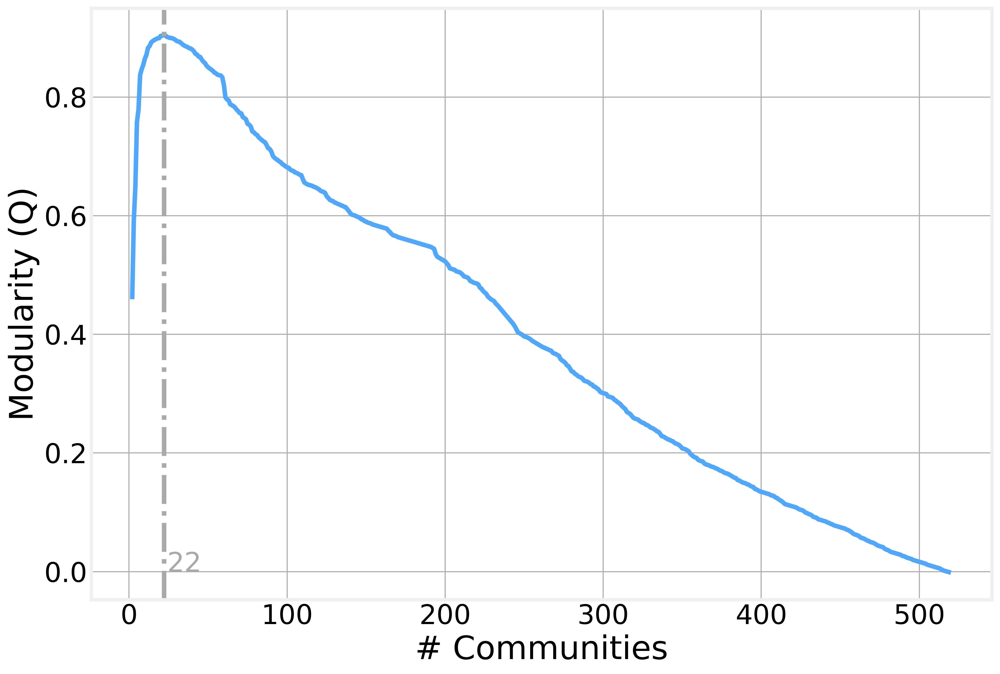

In [33]:
ax = modularity.plot(legend=False)
ax.axvline(x=max_modularity, linestyle='-.', color='darkgray')
ax.text(s=max_modularity, x=max_modularity+2, y=0, color='darkgray')
ax.set_xlabel('# Communities')
ax.set_ylabel('Modularity (Q)')

<div style="width: 100%; overflow: hidden;">
     <img src="https://raw.githubusercontent.com/DataForScience/Networks/master/data/D4Sci_logo_full.png" alt="Data For Science, Inc" align="center" border="0" width=300px> 
</div>